# Step 1: Install Requirements

In [2]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 15916, done.
remote: Counting objects: 100% (36/36), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 15916 (delta 13), reused 27 (delta 9), pack-reused 15880
Receiving objects: 100% (15916/15916), 14.60 MiB | 26.31 MiB/s, done.
Resolving deltas: 100% (10912/10912), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.5/188.5 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 616.7/616.7 kB 25.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.4/57.4 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.3/59.3 kB 8.6 MB/s eta 0:

In [3]:
!pip install easyocr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 813.9/813.9 kB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.0/146.0 kB 18.4 MB/s eta 0:00:00


# Step 2: Assemble Our Dataset

In order to train our custom model, we need to assemble a dataset of representative images with bounding box annotations around the objects that we want to detect. And we need our dataset to be in YOLOv5 format.




##Setting Up Environment

In [4]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"


##Cloning Dataset From Github Repository

In [5]:
# contains modified versions of detect.py, data.yaml
# also contains best.pt !!!
!git clone https://github.com/Ojus999/YOLOv5-ObjectDetection

Cloning into 'YOLOv5-ObjectDetection'...
remote: Enumerating objects: 12554, done.
remote: Counting objects: 100% (49/49), done.
remote: Compressing objects: 100% (46/46), done.
remote: Total 12554 (delta 20), reused 0 (delta 0), pack-reused 12505
Receiving objects: 100% (12554/12554), 325.31 MiB | 35.70 MiB/s, done.
Resolving deltas: 100% (502/502), done.
Updating files: 100% (7511/7511), done.


In [6]:
# setting path to the newly cloned repo
PATH = "/content/yolov5/YOLOv5-ObjectDetection"

# Step 3: Train Our Custom YOLOv5 model
#NOTE : this is not necessary as we are using best.pt file clone from Ojus repo
Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [ ]:
# img arg was 416
# not required as best.pt is there in cloned repo
!python train.py --img 472 --batch 16 --epochs 50 --data {PATH}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/yolov5/YOLOv5-ObjectDetection/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=472, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-198-g34c2187 Python-3.10.6 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, 

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
# not possible  as we have not trained
# %reload_ext tensorboard
# %tensorboard --logdir runs

##Creating Folder for Cropped Images


In [7]:

if not os.path.exists('/content/yolov5/Cropped_Imgs'):
  !mkdir {'/content/yolov5/Cropped_Imgs'}

if not os.path.exists('/content/yolov5/Cropped_Imgs/License'):
  !mkdir {'/content/yolov5/Cropped_Imgs/License'}

if not os.path.exists('/content/yolov5/Cropped_Imgs/Face'):
  !mkdir {'/content/yolov5/Cropped_Imgs/Face'}

##Deleting Files in Cropped Images

In [8]:
# deleting the above mentioned files if they exist
if os.path.exists('/content/yolov5/Cropped_Imgs/Face'):
  Path = '/content/yolov5/Cropped_Imgs/Face'
  for file in os.listdir(Path):
    os.unlink(os.path.join(Path,file))

if os.path.exists('/content/yolov5/Cropped_Imgs/License'):
  Path = '/content/yolov5/Cropped_Imgs/License'
  for file in os.listdir(Path):
    os.unlink(os.path.join(Path,file))

##Move Modified Detect.py To The Required Folder

In [9]:
import shutil


src_path = "/content/yolov5/YOLOv5-ObjectDetection/detect-1.py"
dst_path = "/content/yolov5/detect-1.py"
shutil.move(src_path, dst_path)

'/content/yolov5/detect-1.py'

#Running Inference

Here we run inference using the best.pt stored in YOLOv5-ObjectDetection folder.

##Inference on Images

In [13]:
!python detect-1.py --weights {PATH}/best.pt --img 416 --conf 0.7 --source {PATH}/test/images

detect-1: weights=['/content/yolov5/YOLOv5-ObjectDetection/best.pt'], source=/content/yolov5/YOLOv5-ObjectDetection/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.7, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /usr/local/lib/python3.10/dist-packages/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-209-g493981c Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/179 /content/yolov5/YOLOv5-ObjectDetection/test/images/-I1-MS09uaqsLdGTFkgnS0Rcg1mmPyAj95ySg_eckoM_jpeg_jpg.rf.ca3d216ca28be32265e365299a0af4b6.jpg: 416x416 2 faces, 7.4ms
image 2/179 /content/y

##Inference on Videos

In [10]:
!python detect-1.py --weights {PATH}/best.pt --img 416 --conf 0.7 --source {PATH}/Videos/Video_1.mp4

Progress: |██████████████████████████████████████████████████| 100.0% CompleteDownloading recognition model, please wait. This may take several minutes depending upon your network connection.
Progress: |██████████████████████████████████████████████████| 100.0% Completedetect-1: weights=['/content/yolov5/YOLOv5-ObjectDetection/best.pt'], source=/content/yolov5/YOLOv5-ObjectDetection/Videos/Video_1.mp4, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.7, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /usr/local/lib/python3.10/dist-packages/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-209-g493981c Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers..

In [ ]:
!python detect-1.py --weights {PATH}/best.pt --img 416 --conf 0.7 --source {PATH}/Videos/Video_2.mp4

In [11]:
!python detect-1.py --weights {PATH}/best.pt --img 416 --conf 0.7 --source {PATH}/Videos/Video_3.mp4


Streaming output truncated to the last 5000 lines.
video 1/1 (5468/10465) /content/yolov5/YOLOv5-ObjectDetection/Videos/Video_3.mp4: 256x416 (no detections), 5.2ms
video 1/1 (5469/10465) /content/yolov5/YOLOv5-ObjectDetection/Videos/Video_3.mp4: 256x416 (no detections), 4.8ms
video 1/1 (5470/10465) /content/yolov5/YOLOv5-ObjectDetection/Videos/Video_3.mp4: 256x416 (no detections), 4.7ms
video 1/1 (5471/10465) /content/yolov5/YOLOv5-ObjectDetection/Videos/Video_3.mp4: 256x416 (no detections), 4.6ms
video 1/1 (5472/10465) /content/yolov5/YOLOv5-ObjectDetection/Videos/Video_3.mp4: 256x416 (no detections), 4.7ms
video 1/1 (5473/10465) /content/yolov5/YOLOv5-ObjectDetection/Videos/Video_3.mp4: 256x416 (no detections), 4.7ms
video 1/1 (5474/10465) /content/yolov5/YOLOv5-ObjectDetection/Videos/Video_3.mp4: 256x416 (no detections), 4.7ms
video 1/1 (5475/10465) /content/yolov5/YOLOv5-ObjectDetection/Videos/Video_3.mp4: 256x416 (no detections), 8.4ms
video 1/1 (5476/10465) /content/yolov5/YOLOv5

In [ ]:
#!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.7 --source {dataset.location}/test/images

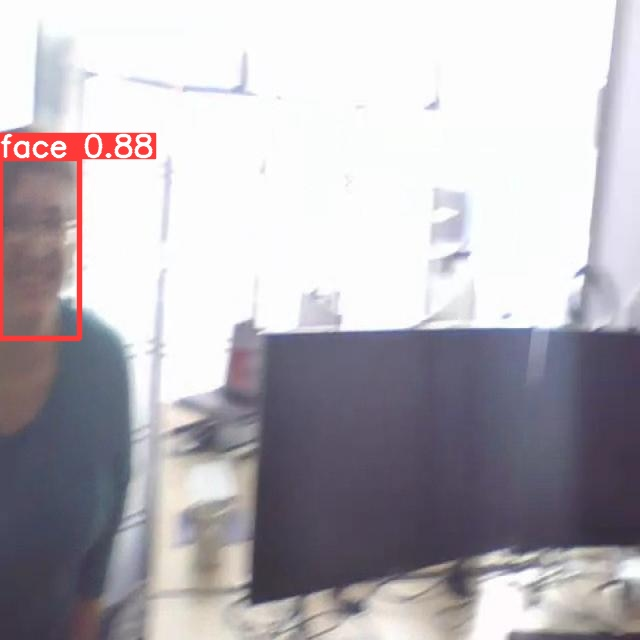

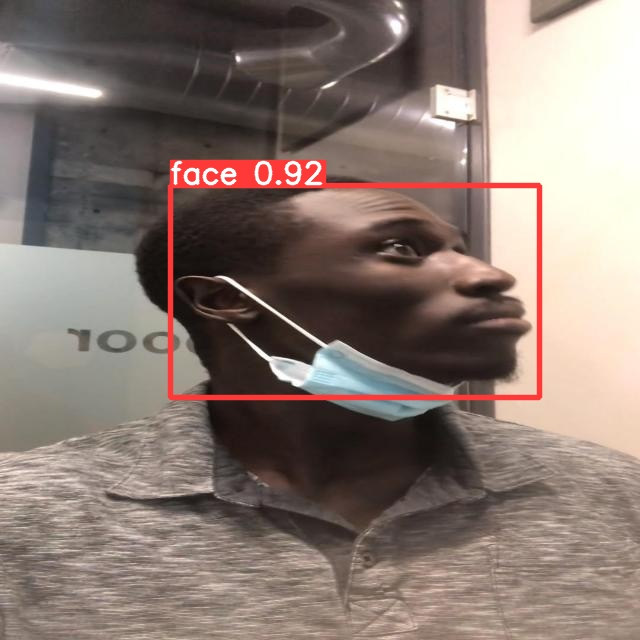

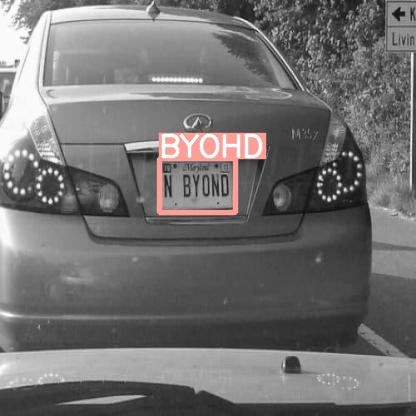

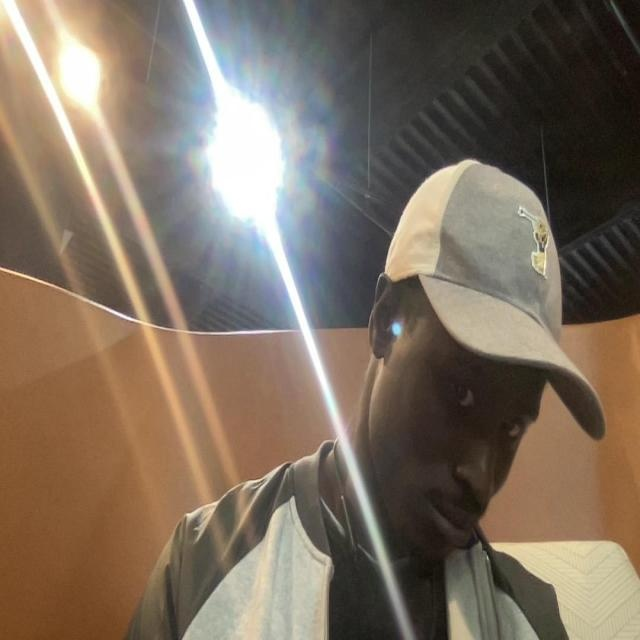

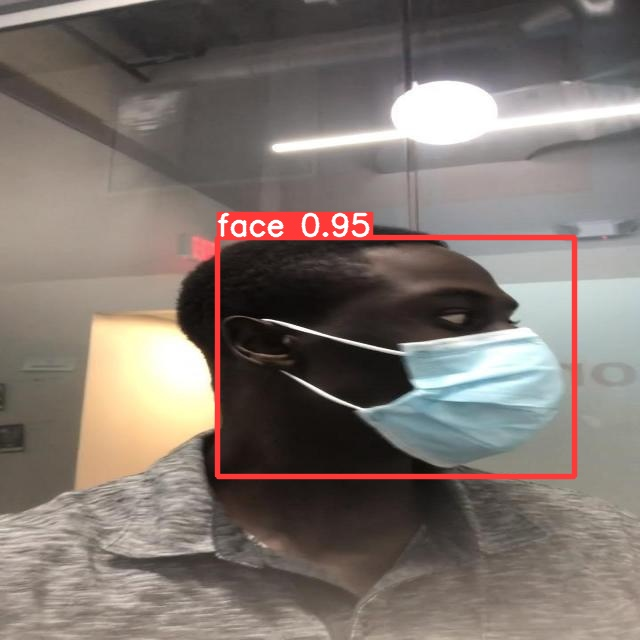

...

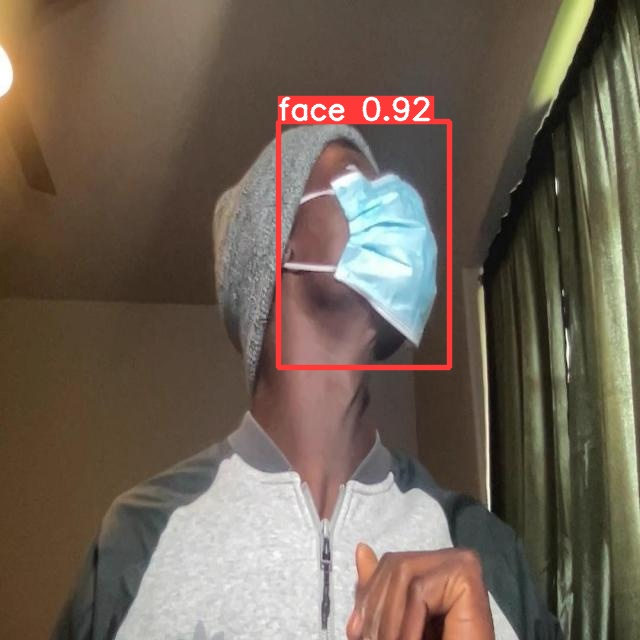

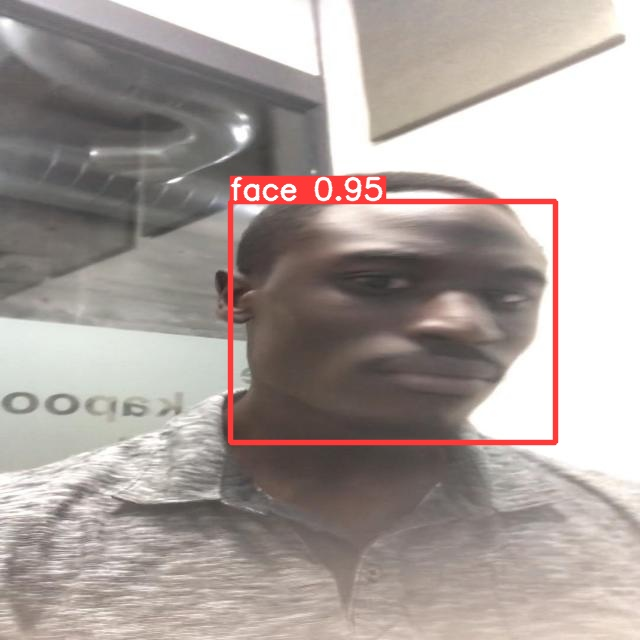

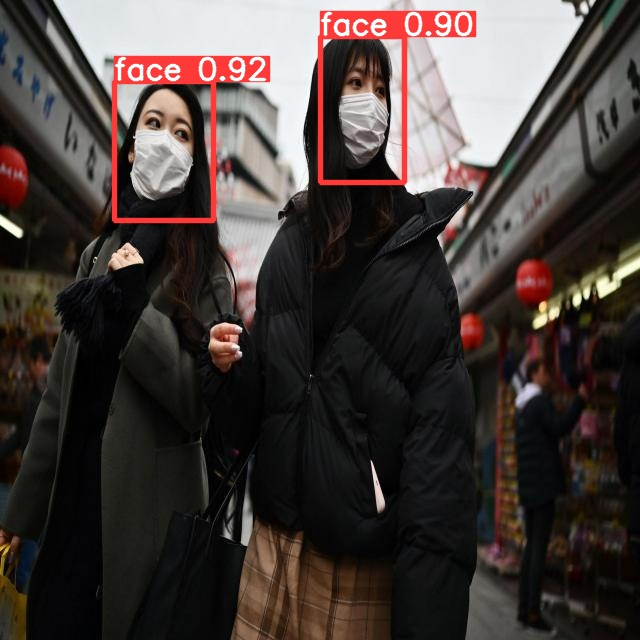

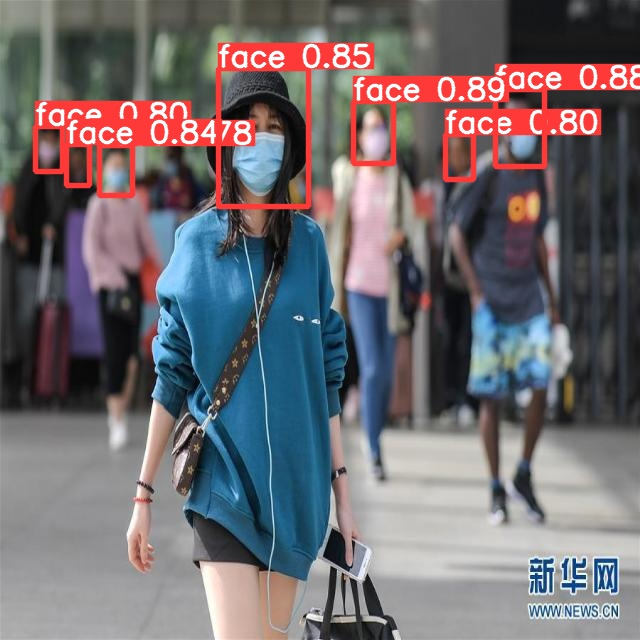

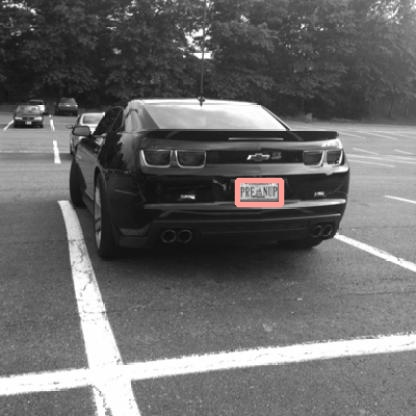

In [15]:
#display inference on ALL test images

import glob
from IPython.display import Image, display
# search where the images are stored in runs folder and give proper path below
for imageName in glob.glob('/content/yolov5/runs/detect/exp3/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

##Downloading The Cropped Images Folders

In [16]:
# creating a folder for zipped files
if not os.path.exists('/content/Zip_Files'):
  !mkdir {'/content/Zip_Files'}

In [17]:
# storing images folder in corresponding zip files
!zip -r "/content/Zip_Files/Face.zip" "/content/yolov5/Cropped_Imgs/Face"
!zip -r "/content/Zip_Files/License.zip" "/content/yolov5/Cropped_Imgs/License"


  adding: content/yolov5/Cropped_Imgs/Face/ (stored 0%)
  adding: content/yolov5/Cropped_Imgs/Face/face_3294ca48-3853-11ee-8191-0242ac1c000c.jpg (deflated 19%)
  adding: content/yolov5/Cropped_Imgs/Face/face_6999299e-3853-11ee-8191-0242ac1c000c.jpg (deflated 23%)
  adding: content/yolov5/Cropped_Imgs/Face/face_334fab24-3853-11ee-8191-0242ac1c000c.jpg (deflated 18%)
  adding: content/yolov5/Cropped_Imgs/Face/face_3227ba98-3853-11ee-8191-0242ac1c000c.jpg (deflated 21%)
  adding: content/yolov5/Cropped_Imgs/Face/face_47d73166-3853-11ee-8191-0242ac1c000c.jpg (deflated 10%)
  adding: content/yolov5/Cropped_Imgs/Face/face_4668c1fa-3853-11ee-8191-0242ac1c000c.jpg (deflated 8%)
  adding: content/yolov5/Cropped_Imgs/Face/face_49d4c7d0-3853-11ee-8191-0242ac1c000c.jpg (deflated 19%)
  adding: content/yolov5/Cropped_Imgs/Face/face_690bc068-3853-11ee-8191-0242ac1c000c.jpg (deflated 22%)
  adding: content/yolov5/Cropped_Imgs/Face/face_325cbf86-3853-11ee-8191-0242ac1c000c.jpg (deflated 11%)
  adding:

##Playing Video with detections


In [2]:
# for displaying og video
import imageio
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from skimage.transform import resize
from IPython.display import HTML

def display_video(video):
    fig = plt.figure(figsize=(3,3))  #Display size specification

    mov = []
    for i in range(len(video)):  #Append videos one by one to mov
        img = plt.imshow(video[i], animated=True)
        plt.axis('off')
        mov.append([img])

    #Animation creation
    anime = animation.ArtistAnimation(fig, mov, interval=50, repeat_delay=1000)

    plt.close()
    return anime

In [3]:
video = imageio.mimread('/content/yolov5/runs/detect/exp/Video_1.mp4',memtest=False)  #Loading video
#video = [resize(frame, (256, 256))[..., :3] for frame in video]    #Size adjustment (if necessary)
HTML(display_video(video).to_html5_video())  #Inline video display in HTML5

In [ ]:
video = imageio.mimread('/content/yolov5/runs/detect/exp2/Video_3.mp4',memtest=False)  #Loading video
#video = [resize(frame, (256, 256))[..., :3] for frame in video]    #Size adjustment (if necessary)
HTML(display_video(video).to_html5_video())  #Inline video display in HTML5

In [ ]:
# @title
pswd = "lbjcflzxstucjfze" # GET APP PASSWORD FROM GMAIL

##SMTP - Sending Email (Zipped folder of License plates sent to law enforcement)


In [6]:

# before execution go to google account security and turn on less secure app access

import smtplib
from email.mime.text import MIMEText
from email.mime.multipart import MIMEMultipart
from email.mime.base import MIMEBase
from email import encoders

# Setup port number and server name

smtp_port = 587                 # Standard secure SMTP port
smtp_server = "smtp.gmail.com"  # Google SMTP Server

# Set up the email lists
email_from = "saiojus@gmail.com"
email_list = ["saiojus@gmail.com"]

# Define the password (better to reference externally)
pswd = "lbjcflzxstucjfze" # GET APP PASSWORD FROM GMAIL


# name the email subject
subject = "New email from TIE with attachments!!"



# Define the email function (dont call it email!)
def send_emails(email_list):

    # send the mail to each person in list
    for person in email_list:

        # Make the body of the email
        body = f"""
        here's the image
        """

        # make a MIME object to define parts of the email
        msg = MIMEMultipart()
        msg['From'] = email_from
        msg['To'] = person
        msg['Subject'] = subject

        # Attach the body of the message
        msg.attach(MIMEText(body, 'plain'))

        # Define the file to attach
        filename2 = "/content/Zip_Files/License.zip"


        # Open the file in python as a binary
        # r for read and b for binary
        attachment2= open(filename2, 'rb')

        # Encode as base 64


        attachment_package2 = MIMEBase('application', 'octet-stream')
        attachment_package2.set_payload((attachment2).read())
        encoders.encode_base64(attachment_package2)
        attachment_package2.add_header('Content-Disposition', "attachment; filename= " + filename2)
        msg.attach(attachment_package2)


        # Cast as string
        text = msg.as_string()

        # Connect with the server
        print("Connecting to server...")
        TIE_server = smtplib.SMTP(smtp_server, smtp_port)
        TIE_server.starttls()
        TIE_server.login(email_from, pswd)
        print("Succesfully connected to server")
        print()


        # Send emails to "person" as list is iterated
        print(f"Sending email to: {person}...")
        TIE_server.sendmail(email_from, person, text)
        print(f"Email sent to: {person}")
        print()

    # Close the port
    TIE_server.quit()


# Run the function
send_emails(email_list)

Connecting to server...
Succesfully connected to server

Sending email to: saiojus@gmail.com...
Email sent to: saiojus@gmail.com

